<a href="https://colab.research.google.com/github/YayunEldina/PCVK_Ganjil_2024/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**D. PRAKTIKUM**

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 50


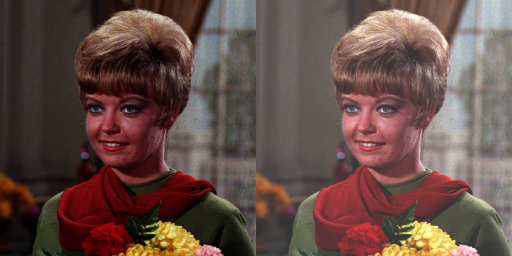

In [4]:
print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
	brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
	print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
	for x in range(original.shape[1]):
		for c in range(original.shape[2]):
			brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

# cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

**E. TUGAS PRAKTIKUM**

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

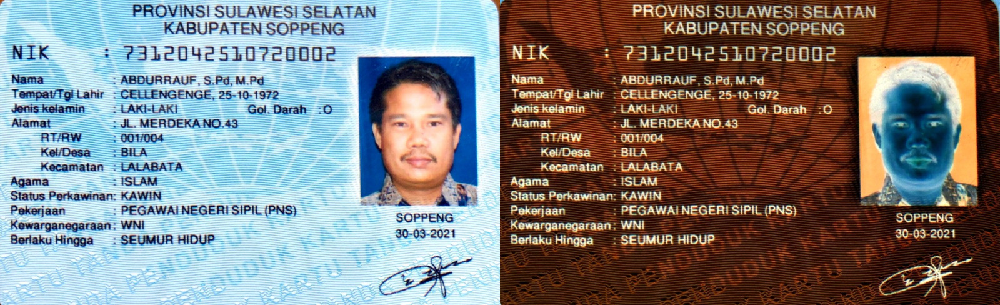

In [3]:
import cv2 as cv  # Pastikan untuk mengimpor cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Membaca citra
img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Memeriksa apakah citra berhasil dimuat
if img is None:
    print("Error: Gambar tidak ditemukan. Silakan periksa jalur file.")
else:
    # Membuat citra negatif
    inverted_img = 255 - img

    # Menggabungkan citra asli dan citra negatif secara berdampingan
    final_frame = cv.hconcat([img, inverted_img])

    # Menampilkan hasil
    cv2_imshow(final_frame)


2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga menghasilkan keluaran seperti berikut:

Mengubah kontras dan tingkat kecerahan citra
------------------------------------------------------------------------
Masukkan tingkat [-255 - 255]: 50
Masukkan kontras [1.0 - 3.0]: 2


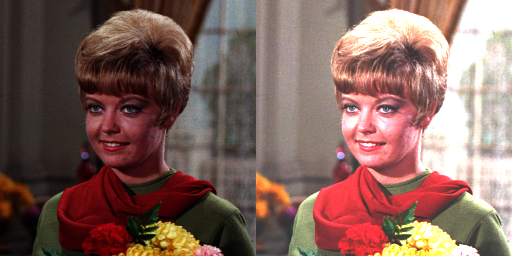

In [5]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('------------------------------------------------------------------------')

try:
  brightness = int(input('Masukkan tingkat [-255 - 255]: '))
  contrast = int(input('Masukkan kontras [1.0 - 3.0]: '))
except ValueError:
  print('Error: Nilai yang dimasukkan harus berupa angka.')


# Load citra
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
	for x in range(original.shape[1]):
		for c in range(original.shape[2]):
			brightness_image[y,x,c] = np.clip(contrast * original[y,x,c] + brightness, 0, 255)

# Menggabungkan citra asli dan hasil untuk perbandingan
final_frame = cv.hconcat([original, brightness_image])

# Menampilkan hasil
cv2_imshow(final_frame)

3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

Mengubah tingkat kecerahan citra dengan Transformasi Log
----------------------------------
Masukkan nilai kecerahan: 50


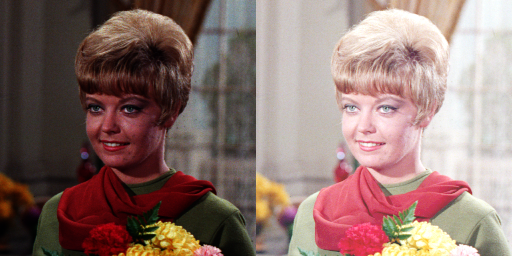

In [6]:
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

# Akses per pixel untuk penyesuaian kecerahan
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(brightness * np.log1p(1 + original[y,x,c]), 0, 255)

# Cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

# Menyusun citra akhir tanpa gambar tengah
final_frame = cv.hconcat((original,  brightness_image))
cv2_imshow(final_frame)


4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:


a.  Averaging

Grayscale Averaging
--------------------------------------


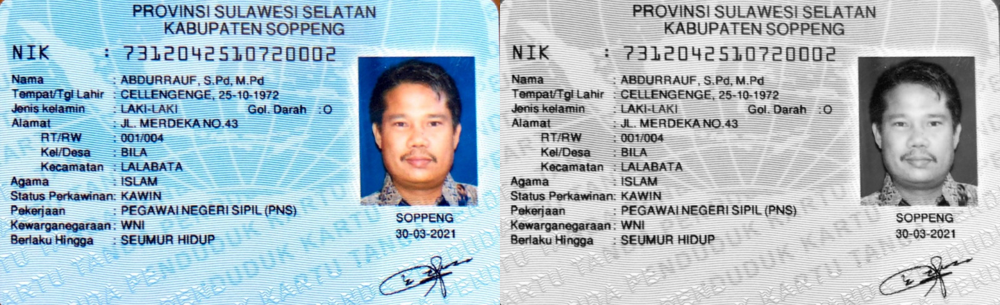

In [7]:
print('Grayscale Averaging')
print('--------------------------------------')

# Load the image
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Check if the image was loaded successfully
if original is None:
    print("Error: Image not found. Please check the file path.")
else:
    # Create an empty grayscale image
    gray_avg = np.zeros((original.shape[0], original.shape[1]), dtype=np.uint8)

    # Access each pixel to compute grayscale value using averaging
    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            R = int(original[y, x, 2])  # Access the Red channel
            G = int(original[y, x, 1])  # Access the Green channel
            B = int(original[y, x, 0])  # Access the Blue channel
            # Compute average grayscale value and assign to the grayscale image
            gray_avg[y, x] = (R + G + B) // 3  # Use integer division

    # Convert the grayscale image to BGR for concatenation
    gray_avg_bgr = cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)

    # Concatenate the original and grayscale images side-by-side
    final_frame = cv.hconcat([original, gray_avg_bgr])

    # Display the result
    cv2_imshow(final_frame)


b.  Lightness

Grayscale Lightness
--------------------------------------


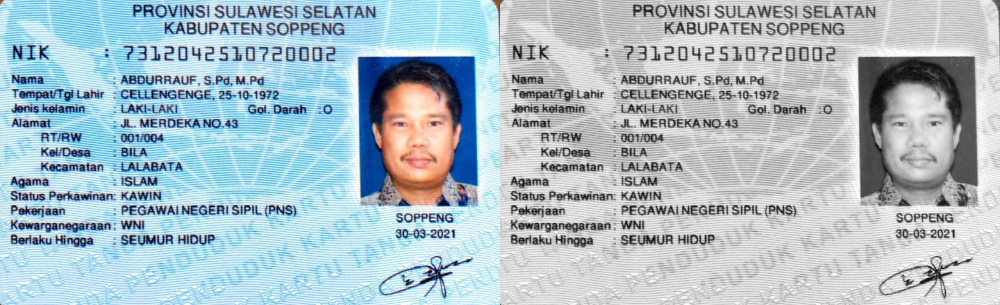

In [8]:
print('Grayscale Lightness')
print('--------------------------------------')

# Load the image
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Check if the image was loaded successfully
if original is None:
    print("Error: Image not found. Please check the file path.")
else:
    # Create an empty grayscale image for lightness method
    gray_lightness = np.zeros((original.shape[0], original.shape[1]), dtype=np.uint8)

    # Access each pixel to compute grayscale value using lightness method
    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            R = int(original[y, x, 2])
            G = int(original[y, x, 1])
            B = int(original[y, x, 0])
            # Compute lightness using the max and min of RGB values
            lightness = (max(R, G, B) + min(R, G, B)) // 2
            gray_lightness[y, x] = lightness

    # Convert the grayscale image to BGR for concatenation
    gray_lightness_bgr = cv.cvtColor(gray_lightness, cv.COLOR_GRAY2BGR)

    # Concatenate the original and grayscale images side-by-side
    final_frame = cv.hconcat([original, gray_lightness_bgr])

    # Display the result
    cv2_imshow(final_frame)


c. Luminance

Grayscale luminance
--------------------


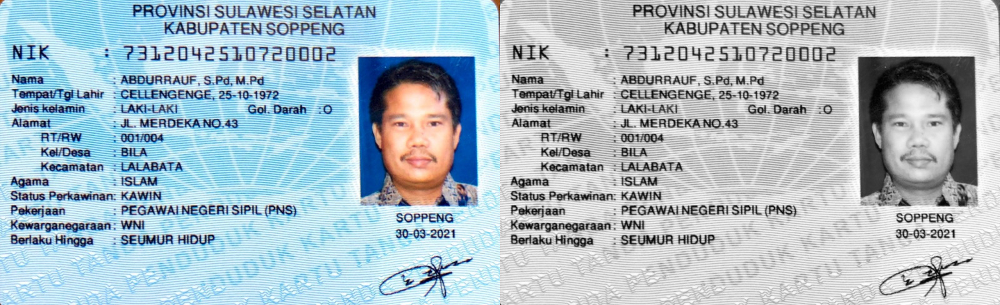

In [9]:
print('Grayscale luminance')
print('--------------------')

# Load the image
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Check if the image was loaded successfully
if original is None:
    print("Error: Image not found. Please check the file path.")
else:
    # Create an empty grayscale image
    gray_luminance = np.zeros((original.shape[0], original.shape[1]), dtype=np.uint8)

    # Access each pixel to compute grayscale value using luminance
    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            R = original[y, x, 2]
            G = original[y, x, 1]
            B = original[y, x, 0]
            # Compute luminance and assign to grayscale image
            gray_luminance[y, x] = int(0.299 * R + 0.587 * G + 0.114 * B)

    # Convert the grayscale image to BGR for concatenation
    gray_luminance_bgr = cv.cvtColor(gray_luminance, cv.COLOR_GRAY2BGR)

    # Concatenate the original and grayscale images
    final_frame = cv.hconcat([original, gray_luminance_bgr])

    # Display the resultConcatenate the original and grayscale images
    cv2_imshow(final_frame)


5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal, tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna biru menjadi grayscale seperti pada contoh berikut:

Highlight Specific Color
------------------------


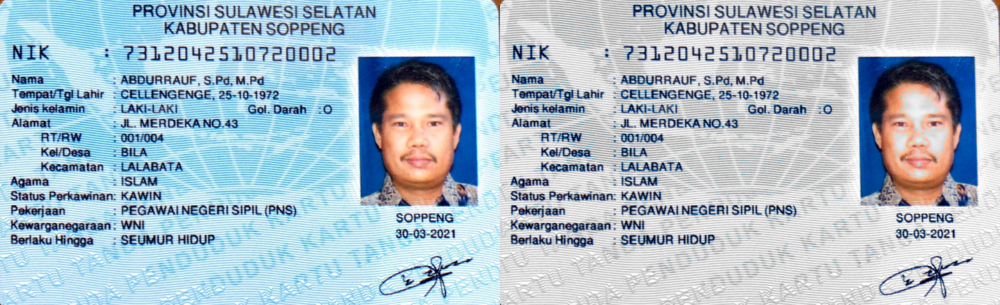

In [10]:
print('Highlight Specific Color')
print('------------------------')

# Load the image
ktp_img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')
res = np.zeros_like(ktp_img)

 # Access each pixel to compute grayscale value using Highlight Specific Color
for y in range(ktp_img.shape[0]):
    for x in range(ktp_img.shape[1]):
        red = ktp_img[y, x, 2]
        green = ktp_img[y, x, 1]
        blue = ktp_img[y, x, 0]

        # Checks if the pixel is blue or skin color
        if (blue > 100 and red < 100 and green < 100) or (red < 255 and green < 205 and blue < 204):
            # If blue or skin color, use original color
            res[y, x] = ktp_img[y, x]
        else:
            # If not blue or skin color, change it to grayscale
            gray_value = 0.21 * red + 0.72 * green + 0.07 * blue
            res[y, x] = [gray_value, gray_value, gray_value]

# Concatenate the original and grayscale images
final_frame = cv.hconcat([ktp_img, res])
cv2_imshow(final_frame)


**LATIHAN WARNA PADA CITRA**

Menampilkan warna pada citra menjadi grayscale
----------------------------------------------------------------------------


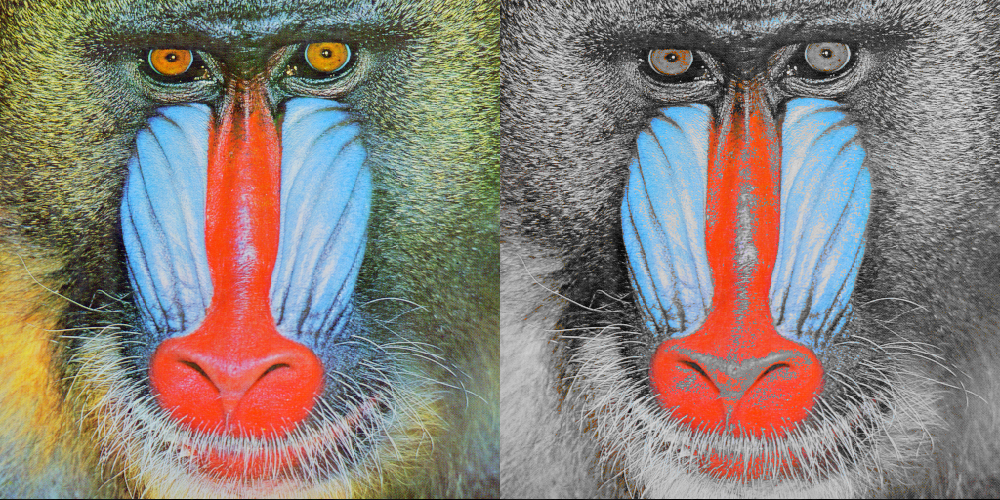

In [12]:
print('Menampilkan warna pada citra menjadi grayscale')
print('----------------------------------------------------------------------------')

# Load the image
mandrill_img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/mandrill.tiff')
res = np.zeros_like(mandrill_img)

# Access per pixel
for y in range(mandrill_img.shape[0]):
    for x in range(mandrill_img.shape[1]):
        red = mandrill_img[y, x, 2]
        green = mandrill_img[y, x, 1]
        blue = mandrill_img[y, x, 0]

        # Checks whether a pixel is blue or red in color
        if (blue > 200 and red < 200 and green < 200) or (red > 100 and green < 100 and blue < 100):
            # If blue or red color, use the original color
            res[y, x] = mandrill_img[y, x]
        else:
            # If it is not a blue or red color, convert it to grayscale
            gray_value = 0.21 * red + 0.72 * green + 0.07 * blue
            res[y, x] = [gray_value, gray_value, gray_value]

# Concatenate the original and grayscale images
final_frame = cv.hconcat([mandrill_img, res])
cv2_imshow(final_frame)